<a href="https://colab.research.google.com/github/adilsonalbino/datascience/blob/main/Analise_de_dados_audi%C3%AAncia.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Análise de dados de Audiência

###Objetivo principal: Descobrir o que pode estar causando a queda de audiência


In [3]:
#Importando bibliotecas
import pandas as pd
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA

In [4]:
#Carregando a base de dados
df = pd.read_csv('/content/dados_desafio.csv',delimiter =',')

In [5]:
#Exibindo previa dos dados carregados
display(df)

,date,hits_hour,geoNetwork_region,device_deviceCategory,editoria,trafficSource_medium,trafficSource_source,variable,value
0,20210101,0,Federal District,mobile,editoria_01,(none),(direct),usuarios,14.0
1,20210101,0,Federal District,mobile,editoria_01,(none),(direct),sessoes,15.0
2,20210101,0,Federal District,mobile,editoria_01,(none),(direct),pageviews,18.0
3,20210101,0,Federal District,mobile,editoria_01,organic,google,usuarios,14.0
4,20210101,0,Federal District,mobile,editoria_01,organic,google,sessoes,15.0
...,...,...,...,...,...,...,...,...,...
366388,20210226,6,State of Bahia,mobile,editoria_01,organic,google,sessoes,38.0
366389,20210226,6,State of Bahia,mobile,editoria_01,organic,google,pageviews,47.0
366390,20210226,6,State of Bahia,mobile,editoria_02,(none),(direct),usuarios,30.0
366391,20210226,6,State of Bahia,mobile,editoria_02,(none),(direct),sessoes,31.0


In [6]:
#Verificando informações do dataset, checando a existencia de dados nulos e os tipos de dados
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 366393 entries, 0 to 366392
Data columns (total 9 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   date                   366393 non-null  object 
 1   hits_hour              366393 non-null  int64  
 2   geoNetwork_region      366393 non-null  object 
 3   device_deviceCategory  366392 non-null  object 
 4   editoria               366392 non-null  object 
 5   trafficSource_medium   366392 non-null  object 
 6   trafficSource_source   366392 non-null  object 
 7   variable               366392 non-null  object 
 8   value                  366392 non-null  float64
dtypes: float64(1), int64(1), object(7)
memory usage: 25.2+ MB


Temos um total de 9 colunas e 834810 linhas no dataset, foi identificado que a coluna "date" não está com o tipo de dados correto, vou corrigir para não nos atrapalhar durante a análise.

In [7]:
#Alterando tipo de dados da coluan "date"
df['date'] = pd.to_datetime(df['date'], dayfirst=True, errors='coerce')

<ipython-input-7-0fba6b2af54b>:2: UserWarning: Parsing dates in %Y%m%d format when dayfirst=True was specified. Pass `dayfirst=False` or specify a format to silence this warning.
  df['date'] = pd.to_datetime(df['date'], dayfirst=True, errors='coerce')


In [8]:
#Checando alteração do tipo de dados da coluna "date"
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 366393 entries, 0 to 366392
Data columns (total 9 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   date                   347292 non-null  datetime64[ns]
 1   hits_hour              366393 non-null  int64         
 2   geoNetwork_region      366393 non-null  object        
 3   device_deviceCategory  366392 non-null  object        
 4   editoria               366392 non-null  object        
 5   trafficSource_medium   366392 non-null  object        
 6   trafficSource_source   366392 non-null  object        
 7   variable               366392 non-null  object        
 8   value                  366392 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(1), object(6)
memory usage: 25.2+ MB


In [9]:
#Exibindo o dataset para validar a coluna "date" se os dados estão corretos após a conversão do tipo
display(df)

,date,hits_hour,geoNetwork_region,device_deviceCategory,editoria,trafficSource_medium,trafficSource_source,variable,value
0,2021-01-01,0,Federal District,mobile,editoria_01,(none),(direct),usuarios,14.0
1,2021-01-01,0,Federal District,mobile,editoria_01,(none),(direct),sessoes,15.0
2,2021-01-01,0,Federal District,mobile,editoria_01,(none),(direct),pageviews,18.0
3,2021-01-01,0,Federal District,mobile,editoria_01,organic,google,usuarios,14.0
4,2021-01-01,0,Federal District,mobile,editoria_01,organic,google,sessoes,15.0
...,...,...,...,...,...,...,...,...,...
366388,2021-02-26,6,State of Bahia,mobile,editoria_01,organic,google,sessoes,38.0
366389,2021-02-26,6,State of Bahia,mobile,editoria_01,organic,google,pageviews,47.0
366390,2021-02-26,6,State of Bahia,mobile,editoria_02,(none),(direct),usuarios,30.0
366391,2021-02-26,6,State of Bahia,mobile,editoria_02,(none),(direct),sessoes,31.0


##Análise das métricas

In [10]:
#Soma da quantidade total por metricas
df_grouped = df.groupby('variable')['value'].sum().to_frame()
display(df_grouped)

,value
variable,
pageviews,6904397.0
sessoes,5970942.0
usuarios,5561986.0


##Analisando de forma individual a métrica "PAGEVIEWS"

In [11]:
# Filtra apenas as linhas em que 'variable' é 'pageviews'
df_filtered = df[df['variable'] == 'pageviews']

# Agrupa pelo campo 'variable' e soma os valores na coluna 'value'
df_grouped = df_filtered.groupby('variable')['value'].sum().to_frame()

# Exibe o resultado
display(df_grouped)


,value
variable,
pageviews,6904397.0


##Top 5 cidades com maior valor de visualição de páginas
######É possível identificar que o estado de são paulo lidera na questão da audiência.

In [12]:
# Agrupa por 'geoNetwork_region' e 'variable' e soma os valores na coluna 'value'
df_grouped = df_filtered.groupby(['geoNetwork_region', 'variable'])['value'].sum().to_frame().reset_index()

# Transforma a coluna 'variable' em colunas (pivotagem)
df_pivoted = df_grouped.pivot(index='geoNetwork_region', columns='variable', values='value')

# Calcula a soma das colunas (variáveis) para cada 'geoNetwork_region' e ordena pelo total
df_pivoted['total_sum'] = df_pivoted.sum(axis=1)

# Ordena pelo valor total da soma em ordem decrescente
df_pivoted_sorted = df_pivoted.sort_values(by='total_sum', ascending=False)

# Remove a coluna 'total_sum' para a exibição final
df_pivoted_sorted = df_pivoted_sorted.drop(columns='total_sum')

# Exibe as primeiras 20 linhas do resultado
display(df_pivoted_sorted.head(5))


variable,pageviews
geoNetwork_region,
State of Sao Paulo,2865086.0
State of Rio de Janeiro,843272.0
State of Minas Gerais,764898.0
State of Parana,384051.0
State of Rio Grande do Sul,365702.0


### Quantidade de pageviews por dispositivo
######É possível identificar que praticamente os usuários tendem a navegar mais nas páginas a partir do mobile, tendo pouca necessidade de usar pelo computador e tablet.

In [13]:
# Agrupa por 'device_deviceCategory' e 'variable' e soma os valores na coluna 'value'
df_grouped = df_filtered.groupby(['device_deviceCategory', 'variable'])['value'].sum().to_frame().reset_index()

# Transforma a coluna 'variable' em colunas (pivotagem)
df_pivoted = df_grouped.pivot(index='device_deviceCategory', columns='variable', values='value')

# Calcula a soma das colunas (variáveis) para cada 'device_deviceCategory' e ordena pelo total
df_pivoted['total_sum'] = df_pivoted.sum(axis=1)

# Ordena pelo valor total da soma em ordem decrescente
df_pivoted_sorted = df_pivoted.sort_values(by='total_sum', ascending=False)

# Remove a coluna 'total_sum' para a exibição final
df_pivoted_sorted = df_pivoted_sorted.drop(columns='total_sum')

# Exibe os dados
display(df_pivoted_sorted)

variable,pageviews
device_deviceCategory,
mobile,6755504.0
desktop,140926.0
tablet,7967.0


###PageViews por mídia de tráfego

In [14]:
# Agrupa por 'Mídia de tráfego' e 'variable' e soma os valores na coluna 'value'
df_grouped = df_filtered.groupby(['trafficSource_medium', 'variable'])['value'].sum().to_frame().reset_index()

# Transforma a coluna 'variable' em colunas (pivotagem)
df_pivoted = df_grouped.pivot(index='trafficSource_medium', columns='variable', values='value')

# Calcula a soma das colunas (variáveis) para cada 'Mídia de tráfego' e ordena pelo total
df_pivoted['total_sum'] = df_pivoted.sum(axis=1)

# Ordena pelo valor total da soma em ordem decrescente
df_pivoted_sorted = df_pivoted.sort_values(by='total_sum', ascending=False)

# Remove a coluna 'total_sum' para a exibição final
df_pivoted_sorted = df_pivoted_sorted.drop(columns='total_sum')

# Exibe os dados
display(df_pivoted_sorted)

variable,pageviews
trafficSource_medium,
(none),3462969.0
organic,2128691.0
referral,1260971.0
(not set),22021.0
social,16899.0
pushnotification,12846.0


###PageViews por origem de tráfego

In [15]:
# Agrupa por 'origem de tráfego' e 'variable' e soma os valores na coluna 'value'
df_grouped = df_filtered.groupby(['trafficSource_source', 'variable'])['value'].sum().to_frame().reset_index()

# Transforma a coluna 'variable' em colunas (pivotagem)
df_pivoted = df_grouped.pivot(index='trafficSource_source', columns='variable', values='value')

# Calcula a soma das colunas (variáveis) para cada 'origem de tráfego' e ordena pelo total
df_pivoted['total_sum'] = df_pivoted.sum(axis=1)

# Ordena pelo valor total da soma em ordem decrescente
df_pivoted_sorted = df_pivoted.sort_values(by='total_sum', ascending=False)

# Remove a coluna 'total_sum' para a exibição final (opcional)
df_pivoted_sorted = df_pivoted_sorted.drop(columns='total_sum')

# Exibe os dados
display(df_pivoted_sorted)

variable,pageviews
trafficSource_source,
(direct),3462969.0
google,2127008.0
googleapis.com,752449.0
facebook,449330.0
news.google.com,43581.0
twitter,26646.0
paywall,20321.0
pushnews,12882.0
taboola,4480.0


##Analise de visualização de páginas ao longo do tempo
#####É possível notar no g´rafico abaixo que a queda de visualizações começou mais forte desde o mês de abril.

In [16]:
# Supõe-se que df_filtered já foi definido anteriormente com os dados filtrados

# Agrupar por dia e somar os pageviews
df_grouped = df_filtered.groupby('date')['value'].sum().reset_index()

# Renomear as colunas para facilitar a leitura
df_grouped.columns = ['date', 'pageviews']

# Definir a coluna 'date' como tipo datetime
df_grouped['date'] = pd.to_datetime(df_grouped['date'])

# Criar o gráfico de linha usando Plotly Express
fig = px.line(
    df_grouped,
    x='date',
    y='pageviews',
    title='Pageviews ao Longo do Tempo',
    labels={'pageviews': 'Número de Pageviews', 'date': 'Data'}
)

# Exibir o gráfico
fig.show()


##Correlação de Pearson

In [17]:
from sklearn.preprocessing import LabelEncoder

# Remova a coluna 'variable'
df_filtered_corr = df_filtered.drop(columns=['variable'])

# Cria um objeto LabelEncoder
le = LabelEncoder()

# Aplica o LabelEncoder nas colunas categóricas
for coluna in df_filtered_corr.select_dtypes(include=['object']).columns:
    # Usa .loc para evitar o SettingWithCopyWarning
    df_filtered_corr.loc[:, coluna] = le.fit_transform(df_filtered_corr[coluna])

# Agora você pode calcular a correlação
correlacao = df_filtered_corr.corr()
display(correlacao)


,date,hits_hour,geoNetwork_region,device_deviceCategory,editoria,trafficSource_medium,trafficSource_source,value
date,1.000000,-0.047349,-0.110137,0.215693,-0.299261,0.007772,-0.064066,0.060554
hits_hour,-0.047349,1.000000,-0.031010,-0.004860,0.043312,0.040378,0.029775,0.019060
geoNetwork_region,-0.110137,-0.031010,1.000000,-0.126927,0.180541,0.144105,0.131941,0.120766
device_deviceCategory,0.215693,-0.004860,-0.126927,1.000000,-0.159087,0.000661,-0.107136,0.053816
editoria,-0.299261,0.043312,0.180541,-0.159087,1.000000,0.023032,0.015930,-0.092429
trafficSource_medium,0.007772,0.040378,0.144105,0.000661,0.023032,1.000000,0.777423,-0.091479
trafficSource_source,-0.064066,0.029775,0.131941,-0.107136,0.015930,0.777423,1.000000,-0.094887
value,0.060554,0.019060,0.120766,0.053816,-0.092429,-0.091479,-0.094887,1.000000


Text(0.5, 1.0, 'Correlação de "Valor de pageviews" com Outras Variáveis')

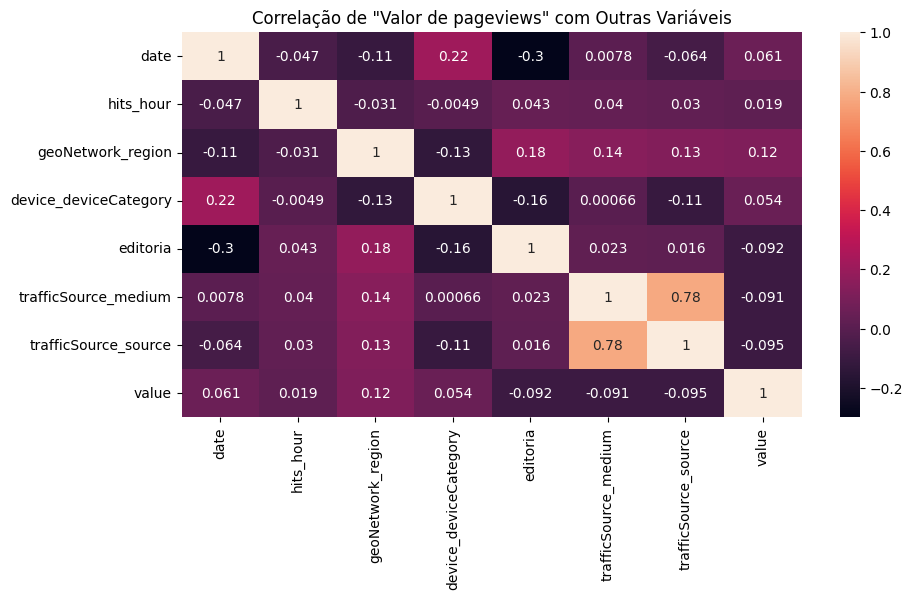

In [18]:
# Calcule a correlação
correlacao = df_filtered_corr.corr()

# Configure o tamanho da figura
plt.rcParams["figure.figsize"] = (10, 5)

# Crie o heatmap para a correlação de 'value' com outras variáveis
sns.heatmap(correlacao, annot=True)

# Adicione título e rótulos
plt.title('Correlação de "Valor de pageviews" com Outras Variáveis')


###Analisando o comportamento variáveis com o PageViews

In [19]:
# Gera e exibe histogramas para cada coluna do DataFrame, diferenciando pelo valor da coluna 'value'
for coluna in df_filtered.columns:
    if coluna != 'value' and coluna != 'variable':  # Evita que a coluna 'value' seja usada como eixo x
        # Configure o tamanho da figura usando width e height
        grafico = px.histogram(df_filtered, x=coluna, y='value', color="variable",
                               title=f'Histograma de {coluna}',
                               width=800, height=400)  # Define largura e altura
        grafico.show()


##Previsão do número de pageviews totais nos dias 5, 6 e 7 de maio

In [20]:
# Agrupar por dia e somar os pageviews
df_grouped = df_filtered.groupby('date')['value'].sum().reset_index()

# Renomear as colunas para facilitar a leitura
df_grouped.columns = ['date', 'pageviews']

# Definir a coluna 'date' como índice e adicionar a frequência diária
df_grouped['date'] = pd.to_datetime(df_grouped['date'])
df_grouped.set_index('date', inplace=True)
df_grouped = df_grouped.asfreq('D')  # 'D' significa frequência diária

# Criar e treinar o modelo ARIMA
model = ARIMA(df_grouped['pageviews'], order=(5, 1, 0))  # Modelo ARIMA (p, d, q)
model_fit = model.fit()

# Fazer previsões para os próximos 3 dias (5, 6 e 7 de maio de 2021)
forecast_steps = 3
forecast = model_fit.forecast(steps=forecast_steps)

# Definir as datas para as previsões
forecast_dates = pd.date_range(start='2021-05-05', periods=forecast_steps, freq='D')

# Criar DataFrame para as previsões
df_forecast = pd.DataFrame({'date': forecast_dates, 'pageviews': forecast})

# Exibir os resultados das previsões
print(f"Previsão de pageviews para os dias 5, 6 e 7 de maio:")
for i, value in enumerate(forecast, start=5):
    print(f"Dia {i} de maio: {value:.2f} pageviews")

# Plotar com Plotly Express
fig = px.line(
    df_grouped.reset_index(),
    x='date',
    y='pageviews',
    title='Previsão de Pageviews para 5, 6 e 7 de Maio',
    labels={'pageviews': 'Número de Pageviews', 'date': 'Data'}
)

# Adicionar as previsões ao gráfico
fig.add_scatter(
    x=df_forecast['date'],
    y=df_forecast['pageviews'],
    mode='lines+markers',
    name='Previsão',
    line=dict(dash='dash', color='red')
)

# Exibir o gráfico
fig.show()

Previsão de pageviews para os dias 5, 6 e 7 de maio:
Dia 5 de maio: 67997.15 pageviews
Dia 6 de maio: 160291.96 pageviews
Dia 7 de maio: 122139.64 pageviews


##Conclusão:

#####Não foi possível identificar uma correlação clara entre o número de pageviews e outras variáveis, nem determinar um motivo específico para a queda nas visualizações com base nos dados fornecidos. No entanto, alguns insights relevantes foram obtidos durante a análise:

-Verifiquei uma queda brusca das visualizações a partir do mês de abril que pode ter ocorrido devido a interrupção dos serviços, pode ter sido a causa principal que está afetando a métrica no mês de maio. Mas isso precisa ser validado se realmente houve interrupção no serviço ou algum outro evento nessa data.

- Caso haja investimentos em campanhas publicitárias, recomenda-se priorizar ações voltadas para dispositivos móveis, visto que são os mais utilizados pelos usuários. Além disso, o foco deve ser nos canais mais eficazes, como "direct" e Google, que apresentam os maiores volumes de tráfego.

- Também é possível que o site da empresa (Grupo Abril) esteja enfrentando problemas técnicos, como lentidão ao carregar em desktops e tablets, o que poderia justificar o baixo número de acessos nesses dispositivos.

- Outro fator a considerar é a baixa presença da marca em alguns estados, o que pode impactar diretamente a métrica de pageviews devido à falta de ações promocionais nessas regiões.

- Por fim, nota-se que a maior parte das visualizações está concentrada em conteúdos das editoras 01 e 05, o que pode indicar falta de interesse ou até rejeição do público em relação aos conteúdos de outras editoras. Nesse caso, seria recomendável coletar feedbacks dos clientes para entender melhor suas preferências e ajustar a estratégia de conteúdo.